## Configuration

In [1]:
# Import packages
import datetime
import gc
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pickle as pkl
from operator import itemgetter
import os
import random
from skimage.transform import resize
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.python.client import device_lib
from tensorflow import keras
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Dropout, Flatten, Dense,Activation, BatchNormalization
from tensorflow.keras.layers import Add, GlobalAvgPool2D, ZeroPadding2D, AveragePooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img
from keras.initializers import glorot_uniform
from tensorflow.keras.layers import add
from tensorflow.keras.regularizers import l2
import time
from tqdm import tqdm
from functools import partial
from PIL import ImageStat, Image

# Processing config
config_test_percent = 0.10
config_validation_perc = 0.2
config_img_height = 220
config_img_width = 220
config_color_mode = "rgb"

# Augmentation config
config_aug_rotation = 50
config_aug_rescale = 1./255
config_aug_shear_range = 0.2
config_aug_zoom_range = [0.8, 1.2]
config_aug_vert_flip = False
config_aug_horz_flip = True
config_aug_width_shift = 0.2
config_aug_height_shift = 0.2
config_aug_brightness_range = [0.95, 1.05]


# Model save & callback config
config_model_timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M")
config_model_save_name = "D:/indoor_scenes/model_save_dir/resnet_keras_room_img_model_{dt_tm}.hdf5".format(dt_tm = config_model_timestamp)
config_log_folder = 'D:/indoor_scenes/log_files/'
config_max_worse_epochs = 20

# Model training config
config_batch_size = 25
config_learning_rate = 0.000025
config_epochs = 600
config_cnn_activation = 'relu'
#config_dropout = 0.3
#config_l2_reg = 0.000001

C:\Users\user\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\Users\user\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\Users\user\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
C:\Users\user\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:519: FutureWarning: Passing (

## Data Processing & Misc. Functions

In [2]:
def read_ade_img_only(ade_folder):
    """
    Read image files in <ade_folder> where file names do not contain:
        > 'atr'
        > 'seg'
        > 'parts'
    """
    all_files = os.listdir(ade_folder)
    sub_files = [af for af in all_files if ('atr' not in af) \
                          and ('seg' not in af) \
                          and ('parts' not in af)]
    full_paths = [ade_folder + sf for sf in sub_files]
    return full_paths



def seconds_to_time(sec):
    """convert seconds (integer or float) to time in 'hh:mm:ss' format"""
    import numpy as np
    if (sec // 3600) == 0:
        HH = '00'
    elif (sec // 3600) < 10:
        HH = '0' + str(int(sec // 3600))
    else:
        HH = str(int(sec // 3600))
    min_raw = (np.float64(sec) - (np.float64(sec // 3600) * 3600)) // 60
    if min_raw < 10:
        MM = '0' + str(int(min_raw))
    else:
        MM = str(int(min_raw))
    sec_raw = (sec - (np.float64(sec // 60) * 60))
    if sec_raw < 10:
        SS = '0' + str(int(sec_raw))
    else:
        SS = str(int(sec_raw))
    return HH + ':' + MM + ':' + SS + ' (hh:mm:ss)'



def sec_to_time_elapsed(end_tm, start_tm, return_time = False):
    """apply seconds_to_time function to start and end times
       * dependency on seconds_to_time() function *"""
    import numpy as np
    sec_elapsed = (np.float64(end_tm) - np.float64(start_tm))
    if return_time:
        return seconds_to_time(sec_elapsed)
    else:
        print('Execution Time: ' + seconds_to_time(sec_elapsed))



def load_resize_images(full_file_paths, resize_height, resize_width):
    """
    Load images and resize according to function arguments
    Args:
        full_file_paths: list of saved image files
        resize_height: height of resized output images
        resize_width: width of resized output images
    Depdendencies:
        numpy
        skimage.transform.resize
        tensorflow.keras.preprocessing.image.load_img
    Returns:
        numpy array of resized images
    """
    read_images = [load_img(c) for c in full_file_paths]
    resized_images = [resize(np.array(ri), (resize_height, resize_width)) for ri in read_images]
    return np.array(resized_images)



def img_add_flip(arr, flip_horiz = True, flip_vert = False):
    """
    Flip numpy array horizontally and/or vertically
    Args:
        arr: three dimensional numpy array
        flip_horiz: flip image horizontally
        flip_vert: flip image vertically
    """
    assert len(arr.shape) == 3, "'arr' input array must be three dimensional"
    arr_copy = arr.copy()
    if flip_horiz:
        arr_copy = np.fliplr(arr_copy)
    if flip_vert:
        arr_copy = np.flipud(arr_copy)
    return arr_copy
    


def img_add_random_noise(arr, noise_perc = 0.05):
    """
    Randomly change <noise_perc> % of pixels in an image
    Args:
        arr: three dimensional numpy array
        noise_perc: percentage of values to replace    
    """
    assert len(arr.shape) == 3, "'arr' input array must be three dimensional"
    arr_copy = arr.copy()
    noise = np.random.randint(0, 255, size = arr.shape)
    rand_numbers = random.sample(range(100), int(noise_perc * 100))
    for x in range(arr.shape[0]):
        for y in range(arr.shape[1]):
            for z in range(arr.shape[2]):
                if random.choice(range(100)) in rand_numbers:
                    arr_copy[x][y][z] += noise[x][y][z]
    return arr_copy
                


def img_add_stripe_noise(arr, stripe_perc = 0.05, stripe_direction = 'h'):
    """
    Add horizontal stripe of randomly colored pixels within a 3d numpy array
    Args:
        arr: three dimensional numpy array
        stripe_perc: height or width of noise stripe (percentage of array dimension)
        stripe_direction: the direction of the noise strip (horizonal or vertical)
    """
    assert len(arr.shape) == 3, "'arr' input array must be three dimensional"
    assert stripe_direction in ['h', 'v'], "'stripe_direction' parameter must be 'v' or 'h'"
    arr_copy = arr.copy()
    noise = np.random.randint(0, 255, size = arr.shape)
    if stripe_direction == 'h':
        use_dim = 0
    else:
        use_dim = 1
    
    # Stripe position
    pixel_length = int(stripe_perc * arr.shape[use_dim])
    stripe_start = random.choice(range(arr.shape[use_dim] - pixel_length))
    stripe_end = stripe_start + pixel_length
    stripe_range = range(stripe_start, stripe_end)
    
    # Value replacement
    for x in range(arr.shape[0]):
        for y in range(arr.shape[1]):
            for z in range(arr.shape[2]):
                if stripe_direction == 'h':
                    if x in stripe_range:
                        arr_copy[x][y][z] += noise[x][y][z]
                else:
                    if y in stripe_range:
                        arr_copy[x][y][z] += noise[x][y][z]
    return arr_copy



def describe_img_sizes(list_of_arrays):
    """
    Describe distribution of array shapes for a list of 3d arrays
    Args:
        list_of_arrays: list of 3d numpy arrays
    Dependencies:
        numpy (import as np)
        pandas (import as pd)
    Returns:
        pandas DataFrame
    """    
    # Dimensions of each array
    img_ht = [a.shape[0] for a in list_of_arrays]
    img_wd = [a.shape[1] for a in list_of_arrays]
    img_d = [a.shape[2] for a in list_of_arrays]
    img_hwd = [a.shape for a in list_of_arrays]
    
    # Mean, median, mode of each single measure
    mean_size = [np.mean(x) for x in [img_ht, img_wd, img_d]]
    median_size = [np.median(x) for x in [img_ht, img_wd, img_d]]
    modal_size = [max(x, key = x.count) for x in [img_ht, img_wd, img_d]]
    
    # Output summary statistics and print most common dimension
    output_df = pd.DataFrame({'dimension': ['height', 'width', 'depth'],
                              'mean' : mean_size,
                              'median' : median_size,
                              'mode' : modal_size})
    
    modal_arr_shape = max(img_hwd, key = img_hwd.count)
    modal_freq = img_hwd.count(modal_arr_shape)
    modal_perc_freq = round(modal_freq / len(img_hwd) * 100, 1)
    print_msg = "The most common array shape is {a} with a frequency of {b} ({c}%)".\
    format(a = str(modal_arr_shape),
           b = str(int(modal_freq)),
           c = str(modal_perc_freq))
    print(print_msg)
    return output_df

    

def demo_data_generator(generator_class):
    """
    Look at 20 examples of images produced by Keras ImageDataGenerator
    Args:
        generator_class: ImageDataGenerator.flow_from_dataframe object
    Dependencies:
        Keras
        matplotlib.pyplot as plt
    """
    plt.figure(figsize=(12, 12))
    for i in range(0, 20):
        plt.subplot(5, 4, i+1)
        for x, y in generator_class:
            plt.imshow(x[0])
            break
    plt.tight_layout()
    plt.show()
        


def shuffle_two_lists(list_a, list_b):
    """
    Randomly shuffle two lists with the same order, return numpy arrays
    Args:
        list_a: first list you want to shuffle
        list_b: second list you want to shuffle
    Dependencies:
        numpy (import as np)
        operator.itemgetter
        random
    """
    assert len(list_a) == len(list_b), "two input lists must have the same length"
    
    # Define inner function
    def index_slice_list(lst, indices):
    # Slice list by list of indices
        list_slice = itemgetter(*indices)(lst)
        if len(indices) == 1:
            return [list_slice]
        else:
            return list(list_slice)
    
    # Randomly shuffle positional indices
    shuffle_indices = [i for i in range(len(list_a))]
    random.shuffle(shuffle_indices)
    
    # Reorder and return lists
    a_shuffled = index_slice_list(lst = list_a, indices = shuffle_indices)
    b_shuffled = index_slice_list(lst = list_b, indices = shuffle_indices)
    return a_shuffled, b_shuffled



def make_class_weight_dict(train_y_labels, return_dict = False):
    """
    Return dictionary of inverse class weights for imbalanced response
    Args:
        train_y_labels: training set response variable (list)
        return_dict: if True, return dictionary of classes & weights..else return list of classes and list of weights
    """
    train_class_counts = dict((x,train_y_labels.count(x)) for x in set(train_y_labels))
    max_class = max(train_class_counts.values())
    class_weights = [max_class / x for x in train_class_counts.values()]
    class_weight_dict = dict(zip([i for i in train_class_counts.keys()], class_weights))
    if return_dict:
        return class_weight_dict
    else:
        return list(class_weight_dict.keys()), list(class_weight_dict.values())

## Duplicate Image File Check/Removal Functions

In [3]:
def unnest_list_of_lists(LOL):
    """Unnest list of lists"""
    import itertools
    return list(itertools.chain.from_iterable(LOL))



def img_to_hash(img_path, new_size = (20,20)):
    """
    *** inspired by Vladislav Zorov ***
    Create approximate unique hash for a resized image
    Args:
        img_path: path to image file
        new_size: tuple of width and height dimensions of resized image
    """
    img_obj = Image.open(img_path).resize(new_size, Image.LANCZOS).convert(mode="L")
    img_mean = ImageStat.Stat(img_obj).mean[0]
    return sum((1 if j > img_mean else 0) << i for i, j in enumerate(img_obj.getdata()))



def index_slice_list(lst, indices):
    """Slice list by list of indices"""
    from operator import itemgetter
    list_slice = itemgetter(*indices)(lst)
    if len(indices) == 1:
        return [list_slice]
    else:
        return list(list_slice)


    
def lst_dupl_indices(lst):
    """Returns indices of list with duplicated elements"""
    output_list = []
    for i, x in enumerate(lst):
        if len([j for j in range(len(lst)) if lst[j] == x]) > 1:
            output_list.append(i)
    return output_list



def find_duplicate_images(path_list, delete_duplicates = False):
    """
    Using approximate hashing for image files, identify/delete duplicate images
    Args:
        path_list: list of paths to image files
        delete_duplicates: if True, delete duplicate files from system otherwise print count
    """
    all_path_hash = [img_to_hash(x) for x in tqdm(path_list)]
    dupl_path_indices = lst_dupl_indices(all_path_hash)
    if len(dupl_path_indices) == 0:
        print("\n\nNo duplicate images found")
    else:
        dupl_df = pd.DataFrame({'path' : path_list, 'hash' : all_path_hash}).iloc[dupl_path_indices]
        keep_list = []
        remove_list = []
        unique_hash = set(dupl_df['hash'])
        for i, x in enumerate(unique_hash):
            same_files = list(set(dupl_df[dupl_df.hash == x]['path']))
            keep_list.append(same_files[0])
            for f in same_files[1:]:
                remove_list.append(f)
        if delete_duplicates:
            print("\n\nDeleting {n} duplicate image files".format(n = str(int(len(remove_list)))))
            for rl in remove_list:
                os.remove(rl)
        else:
            print("\n\n{n} duplicate image files found".format(n = str(int(len(remove_list)))))

## Model Fitting Functions / Classes

In [4]:
def get_number_gpu():
    """
    Return number of available GPUs
    Dependencies:
        from tensorflow.python.client import device_lib
    """
    n_gpu = len([x.name for x in device_lib.list_local_devices() if x.device_type == 'GPU'])
    return n_gpu

In [5]:
def resnet_identity_block(input_x, stage_name, block_name, n_filters = [32,32,32], conv2_kernel_size = (3,3),
                          init_seed = 0, conv_activation = 'relu'):
    """
    Keras identity block for residual network ('resnet')
    Args:
        input_x : tensor input
        n_filters: list with three elements - filter size for each convolutional layer
        conv2_kernel_size: the window size for the middle convolutional layer (first and last are (1,1))
        stage_name: name of resnet layer stage (used for naming layers in serialized output)
        block_name: name of resnet identity block (used for naming layers in serialized output)
        init_seed: seed for random initilization
        conv_activation: activation function
    Returns:
        tensor output
    """
    
    # Input value to be added back with convolutional output
    x_shortcut = input_x
    
    # Component 1
    x = Conv2D(filters = n_filters[0], kernel_size = (1, 1), strides = (1,1), padding = 'valid',
               kernel_initializer = glorot_uniform(seed = init_seed),
               name = "res_layer_{s}_{b}_{c}".format(s = stage_name, b = block_name, c = "2a"))(input_x)
    x = BatchNormalization(axis = 3, name = "batchnorm_{s}_{b}_{c}".format(s = stage_name, b = block_name, c = "2a"))(x)
    x = Activation('relu')(x)
    
    # Component 2
    x = Conv2D(filters = n_filters[1], kernel_size = conv2_kernel_size, strides = (1,1), padding = 'same',
               kernel_initializer = glorot_uniform(seed = init_seed),
               name = "res_layer_{s}_{b}_{c}".format(s = stage_name, b = block_name, c = "2b"))(x)
    x = BatchNormalization(axis = 3, name = "batchnorm_{s}_{b}_{c}".format(s = stage_name, b = block_name, c = "2b"))(x)
    x = Activation('relu')(x)

    # Component 3
    x = Conv2D(filters = n_filters[2], kernel_size = (1, 1), strides = (1,1), padding = 'valid',
               kernel_initializer = glorot_uniform(seed = init_seed),
               name = "res_layer_{s}_{b}_{c}".format(s = stage_name, b = block_name, c = "2c"))(x)
    x = BatchNormalization(axis = 3, name = "batchnorm_{s}_{b}_{c}".format(s = stage_name, b = block_name, c = "2c"))(x)
    
    # Shortcut step - add input back to convolutional output 
    x = Add()([x, x_shortcut])
    x = Activation(conv_activation)(x)
    
    return x



def resnet_conv_block(input_x, stage_name, block_name, n_filters = [32,32,32], conv2_kernel_size = (3,3),
                      stride_len = 2, init_seed = 0, conv_activation = 'relu'):
    """
    Keras convolutional block for residual network ('resnet')
    Args:
        input_x : tensor input
        n_filters: list with three elements - filter size for each convolutional layer
        conv2_kernel_size: the window size for the middle convolutional layer (first and last are (1,1))
        stage_name: name of resnet layer stage (used for naming layers in serialized output)
        block_name: name of resnet identity block (used for naming layers in serialized output)
        init_seed: seed for random initilization
        conv_activation: activation function
    Returns:
        tensor output
    """
    
    # Input value to be added back with convolutional output
    x_shortcut = input_x

    # Component 1
    x = Conv2D(n_filters[0], (1, 1), strides = (stride_len, stride_len), padding = 'valid',
               kernel_initializer = glorot_uniform(seed = init_seed),
               name = "res_layer_{s}_{b}_{c}".format(s = stage_name, b = block_name, c = "2a"))(input_x)
    x = BatchNormalization(axis = 3, name = "batchnorm_{s}_{b}_{c}".format(s = stage_name, b = block_name, c = "2a"))(x)
    x = Activation(conv_activation)(x)

    # Component 2
    x = Conv2D(n_filters[1], conv2_kernel_size, strides = (1,1), padding = 'same',
               kernel_initializer = glorot_uniform(seed = init_seed),
               name = "res_layer_{s}_{b}_{c}".format(s = stage_name, b = block_name, c = "2b"))(x)
    x = BatchNormalization(axis = 3, name = "batchnorm_{s}_{b}_{c}".format(s = stage_name, b = block_name, c = "2b"))(x)
    x = Activation(conv_activation)(x)

    # Component 3
    x = Conv2D(n_filters[2], (1, 1), strides = (1,1), padding = 'valid',
               kernel_initializer = glorot_uniform(seed = init_seed),
               name = "res_layer_{s}_{b}_{c}".format(s = stage_name, b = block_name, c = "2c"))(x)
    x = BatchNormalization(axis = 3, name = "batchnorm_{s}_{b}_{c}".format(s = stage_name, b = block_name, c = "2c"))(x)

    # Shortcut
    x_shortcut = Conv2D(n_filters[2], (1, 1), strides = (stride_len, stride_len),
                        name = "res_layer_{s}_{b}_{c}".format(s = stage_name, b = block_name, c = "1"),
                        padding = 'valid', kernel_initializer = glorot_uniform(seed = init_seed))(x_shortcut)
    x_shortcut = BatchNormalization(axis = 3, name = "batchnorm_{s}_{b}_{c}".format(s = stage_name, b = block_name, c = ""))(x_shortcut)

    # Final step: Add shortcut value to main path, and pass it through a RELU activation
    x = Add()([x,x_shortcut])
    x = Activation(conv_activation)(x)
    
    return x

## Evaluation Functions

In [6]:
def multiclass_auc(pred_prob_arr, actual_y_values, class_order):
    """
    Calculate area under the curve (AUC) for each class in a multinomial prediction
    Args:
        pred_prob_arr: numpy array with each class' predicted probability
        actual_y_values: the actual response variable being predicted
        class_order: list of classes in the column-wise order they appear in pred_prob_arr
    Dependencies:
        sklearn.metrics.roc_curve
        sklearn.metrics.auc
        numpy 
    """
    
    # Dictionary of binary arrays for each class
    class_dict = {}
    for i, k in enumerate(class_order):
        class_dict[k] = [1 if c == class_order[i] else 0 for c in class_order]
        
    y_binary_arr = np.vstack([class_dict.get(y) for y in actual_y_values])
    
    # AUC calculation
    fpr = dict()
    tpr = dict()
    auc_list = []
    for i in range(len(class_order)):
        fpr[i], tpr[i], _ = roc_curve(y_binary_arr[:,i], pred_prob_arr[:,i])
        auc_list.append(auc(fpr[i], tpr[i]))
    roc_auc_dict = dict(zip(class_order, auc_list))
        
    return roc_auc_dict

def plot_random_test_pred(test_y_list, pred_arr, class_list, img_arr):
    """
    Plot random image and its predicted values for  each class
    Args:
        test_y_list: list of response values being predicted
        pred_arr: predicted probability array
        class_list: list of classes in column-wise order of <pred_arr>
        img_arr: array from which to sample image
    Dependencies:
        random, numpy, matplotlib.pyplot
    """
    random_index = random.choice(range(len(test_y_list)))
    actual_str = "Actual: {k}\n".format(k = test_y_list[random_index])
    pred_str = "\n".join([class_list[i] + ": " + \
                          str(round(pred_arr[random_index,i] * 100,1)) + "%" \
                          for i in range(len(class_list))])
    plt.imshow(img_arr[random_index])
    plt.title(actual_str + pred_str)
    
def plot_training_progress(csv_file_path, train_metric, validation_metric,
                           train_color = 'blue', validation_color = 'orange'):
    """
    Plot training progress using Keras csv logger as input
    Args:
        csv_file_path: path to csv created by keras.callbacks.CSVLogger
        train_metric: name of column used for training evaluation (e.g. 'acc')
        validation_metric: name of column used for validation evaluation (e.g. 'val_acc')
    """
    train_progress_df = pd.read_csv(csv_file_path)
    plt.plot('epoch', train_metric, data = train_progress_df, marker='o',
             markerfacecolor=train_color, color=train_color, label = train_metric)
    plt.plot('epoch', validation_metric, data = train_progress_df, marker='o',
             markerfacecolor=validation_color, color=validation_color, label = validation_metric)
    plt.legend()

## Source Data - File Paths

In [7]:
# Folder Paths
bathroom_folder_ade = "D:/room_dataset/ADE20K_2016_07_26/images/training/b/bathroom/"
bathroom_folder_mit = "D:/indoor_scenes/mit_images/bathroom/"
bathroom_folder_mine = "D:/indoor_scenes/my_images/bathroom/"
bathroom_folder_trulia = "D:/indoor_scenes/trulia_images/bathroom/"

# Full File Paths
bathroom_paths_ade = read_ade_img_only(bathroom_folder_ade)
bathroom_paths_mit = [bathroom_folder_mit + f for f in os.listdir(bathroom_folder_mit)]
bathroom_paths_mine = [bathroom_folder_mine + f for f in os.listdir(bathroom_folder_mine)]
bathroom_paths_trulia = [bathroom_folder_trulia + f for f in os.listdir(bathroom_folder_trulia)]
bathroom_paths = bathroom_paths_ade + bathroom_paths_mit + bathroom_paths_mine + bathroom_paths_trulia

# Folder Paths
bedroom_folder_ade = "D:/room_dataset/ADE20K_2016_07_26/images/training/b/bedroom/"
bedroom_folder_mit = "D:/indoor_scenes/mit_images/bedroom/"
bedroom_folder_mine = "D:/indoor_scenes/my_images/bedroom/"
bedroom_folder_trulia = "D:/indoor_scenes/trulia_images/bedroom/"

# Full File Paths
bedroom_paths_ade = read_ade_img_only(bedroom_folder_ade)
bedroom_paths_mit = [bedroom_folder_mit + f for f in os.listdir(bedroom_folder_mit)]
bedroom_paths_mine = [bedroom_folder_mine + f for f in os.listdir(bedroom_folder_mine)]
bedroom_paths_trulia = [bedroom_folder_trulia + f for f in os.listdir(bedroom_folder_trulia)]
bedroom_paths = bedroom_paths_ade + bedroom_paths_mit + bedroom_paths_mine + bedroom_paths_trulia

# Folder Paths
dining_room_folder_ade = "D:/room_dataset/ADE20K_2016_07_26/images/training/d/dining_room/"
dining_room_folder_mit = "D:/indoor_scenes/mit_images/dining_room/"
dining_room_folder_mine = "D:/indoor_scenes/my_images/dining_room/"
dining_room_folder_trulia = "D:/indoor_scenes/trulia_images/diningroom/"

# Full File Paths
dining_room_paths_ade = read_ade_img_only(dining_room_folder_ade)
dining_room_paths_mit = [dining_room_folder_mit + f for f in os.listdir(dining_room_folder_mit)]
dining_room_paths_mine = [dining_room_folder_mine + f for f in os.listdir(dining_room_folder_mine)]
dining_room_paths_trulia = [dining_room_folder_trulia + f for f in os.listdir(dining_room_folder_trulia)]
dining_room_paths = dining_room_paths_ade + dining_room_paths_mit + dining_room_paths_mine + dining_room_paths_trulia

# Folder Paths
kitchen_folder_ade = "D:/room_dataset/ADE20K_2016_07_26/images/training/k/kitchen/"
kitchen_folder_mit = "D:/indoor_scenes/mit_images/kitchen/"
kitchen_folder_mine = "D:/indoor_scenes/my_images/kitchen/"
kitchen_folder_trulia = "D:/indoor_scenes/trulia_images/kitchen/"

# Full File Paths
kitchen_paths_ade = read_ade_img_only(kitchen_folder_ade)
kitchen_paths_mit = [kitchen_folder_mit + f for f in os.listdir(kitchen_folder_mit)]
kitchen_paths_mine = [kitchen_folder_mine + f for f in os.listdir(kitchen_folder_mine)]
kitchen_paths_trulia = [kitchen_folder_trulia + f for f in os.listdir(kitchen_folder_trulia)]
kitchen_paths = kitchen_paths_ade + kitchen_paths_mit + kitchen_paths_mine + kitchen_paths_trulia

# Folder Paths
living_room_folder_ade = "D:/room_dataset/ADE20K_2016_07_26/images/training/l/living_room/"
living_room_folder_mit = "D:/indoor_scenes/mit_images/livingroom/"
living_room_folder_mine = "D:/indoor_scenes/my_images/livingroom/"
living_room_folder_trulia = "D:/indoor_scenes/trulia_images/livingroom/"

# Full File Paths
living_room_paths_ade = read_ade_img_only(living_room_folder_ade)
living_room_paths_mit = [living_room_folder_mit + f for f in os.listdir(living_room_folder_mit)]
living_room_paths_mine = [living_room_folder_mine + f for f in os.listdir(living_room_folder_mine)]
living_room_paths_trulia = [living_room_folder_trulia + f for f in os.listdir(living_room_folder_trulia)]
living_room_paths = living_room_paths_ade + living_room_paths_mit + living_room_paths_mine + living_room_paths_trulia

## Source Data - Check for (and delete) Duplicate Images

In [8]:
all_paths = bathroom_paths + living_room_paths + bedroom_paths + dining_room_paths + kitchen_paths
find_duplicate_images(all_paths, delete_duplicates = True)

100%|███████████████████████████████████████████████████████████████████████████| 21397/21397 [01:50<00:00, 194.49it/s]




No duplicate images found


## Read & Transform Source Data

In [9]:
# Split files of each class into train and test
train_bathroom, test_bathroom = train_test_split(bathroom_paths, test_size = config_test_percent, random_state = 42)
train_bedroom, test_bedroom = train_test_split(bedroom_paths, test_size = config_test_percent, random_state = 42)
train_diningroom, test_diningroom = train_test_split(dining_room_paths, test_size = config_test_percent, random_state = 42)
train_kitchen, test_kitchen = train_test_split(kitchen_paths, test_size = config_test_percent, random_state = 42)
train_livingroom, test_livingroom = train_test_split(living_room_paths, test_size = config_test_percent, random_state = 42)
agg_train_files = train_bathroom + train_bedroom + train_diningroom + train_kitchen + train_livingroom
agg_test_files = test_bathroom + test_bedroom + test_diningroom + test_kitchen + test_livingroom

# Create training labels
train_y_bathroom = ['bathroom' for x in range(len(train_bathroom))]
train_y_bedroom = ['bedroom' for x in range(len(train_bedroom))]
train_y_diningroom = ['diningroom' for x in range(len(train_diningroom))]
train_y_kitchen = ['kitchen' for x in range(len(train_kitchen))]
train_y_livingroom = ['livingroom' for x in range(len(train_livingroom))]
agg_train_y = train_y_bathroom + train_y_bedroom + train_y_diningroom + train_y_kitchen + train_y_livingroom

# Create test set labels
test_y_bathroom = ['bathroom' for x in range(len(test_bathroom))]
test_y_bedroom = ['bedroom' for x in range(len(test_bedroom))]
test_y_diningroom = ['diningroom' for x in range(len(test_diningroom))]
test_y_kitchen = ['kitchen' for x in range(len(test_kitchen))]
test_y_livingroom = ['livingroom' for x in range(len(test_livingroom))]
agg_test_y = test_y_bathroom + test_y_bedroom + test_y_diningroom + test_y_kitchen + test_y_livingroom

# Class Weights
class_list, class_weights = make_class_weight_dict(agg_train_y, return_dict = False)

# Generator dataframes to be fed into batch processing
train_gen_df = pd.DataFrame({'file_name':  agg_train_files, 'category' : agg_train_y})
train_gen_df, valid_gen_df = train_test_split(train_gen_df, test_size = config_validation_perc, random_state = 42)
test_gen_df = pd.DataFrame({'file_name':  agg_test_files, 'category' : agg_test_y})


# Generator class objects
train_datagen = ImageDataGenerator(rotation_range = config_aug_rotation,
                                   rescale = config_aug_rescale,
                                   shear_range = config_aug_shear_range,
                                   zoom_range = config_aug_zoom_range,
                                   vertical_flip = config_aug_vert_flip,
                                   horizontal_flip = config_aug_horz_flip,
                                   width_shift_range = config_aug_width_shift,
                                   height_shift_range = config_aug_height_shift,
                                   brightness_range = config_aug_brightness_range)

valid_datagen = ImageDataGenerator(rescale = config_aug_rescale)

# Link image augmentation class objects with file dataframes
train_generator = train_datagen.flow_from_dataframe(train_gen_df,  
                                                    x_col = "file_name", 
                                                    y_col = "category",
                                                    target_size = (config_img_height, config_img_width),
                                                    class_mode = "categorical",
                                                    batch_size = config_batch_size,
                                                    classes = class_list,
                                                    color_mode = config_color_mode)

valid_generator = valid_datagen.flow_from_dataframe(valid_gen_df,  
                                                    x_col = "file_name", 
                                                    y_col = "category",
                                                    target_size = (config_img_height, config_img_width),
                                                    class_mode = "categorical",
                                                    batch_size = config_batch_size,
                                                    classes = class_list,
                                                    color_mode = config_color_mode)

test_generator = valid_datagen.flow_from_dataframe(test_gen_df,  
                                                    x_col = "file_name", 
                                                    y_col = "category",
                                                    target_size = (config_img_height, config_img_width),
                                                    class_mode = None,
                                                    shuffle = False,
                                                    batch_size = config_batch_size,
                                                    classes = class_list,
                                                    color_mode = config_color_mode)

Found 15404 validated image filenames belonging to 5 classes.
Found 3851 validated image filenames belonging to 5 classes.


C:\Users\user\Anaconda3\lib\site-packages\keras_preprocessing\image\dataframe_iterator.py:211: UserWarning: `classes` will be ignored given the class_mode="None"
  .format(self.class_mode))


Found 2142 validated image filenames.


## Fit CNN on Training Set

In [10]:
# Start timer and clear session
train_start_time = time.time()
keras.backend.clear_session()
    
# Checkpoint and logging
check_point = keras.callbacks.ModelCheckpoint(config_model_save_name, monitor = 'val_loss', verbose = 1, save_best_only = True, mode = 'min')
early_stop = keras.callbacks.EarlyStopping(monitor = 'val_loss', mode = 'min', patience = config_max_worse_epochs)
csv_logger = keras.callbacks.CSVLogger("{fold}log_{ts}.csv".format(fold = config_log_folder, ts = config_model_timestamp))

In [11]:
# Define network structure
def resnet_model(input_shape = (32, 32, 3), n_classes = 5, init_seed = 0, conv_activation = 'relu'):
    """
    Resnet model object in Keras
    Args:
        input_shape: shape of images
        n_classes: number of classes
        init_seed: seed for random initilization
        conv_activation: activation function used in convolutional layers
        dense_dropout: dropout rate applied to feed forward layers

    Returns:
        Keras Model() object
    """
    # Define the input as a tensor with shape input_shape
    x_input = Input(input_shape)
    
    # Zero-Padding
    x = ZeroPadding2D((3, 3))(x_input)
    
    # Stage 1
    x = Conv2D(32, (7, 7), strides = (1, 1), name = "conv1", kernel_initializer = glorot_uniform(seed = init_seed))(x)
    x = BatchNormalization(axis = 3, name = "bn_conv1")(x)
    x = Activation(conv_activation)(x)
    x = MaxPooling2D((3, 3))(x)

    # Stage 2
    x = resnet_conv_block(input_x = x, conv2_kernel_size = (3,3), n_filters = [32, 32, 128], stage_name = 2, block_name = "a", stride_len = 1)
    x = resnet_identity_block(input_x = x, conv2_kernel_size = (3,3), n_filters = [32, 32, 128], stage_name = 2, block_name = "b")
    x = resnet_identity_block(input_x = x, conv2_kernel_size = (3,3), n_filters = [32, 32, 128], stage_name = 2, block_name = "c")

    # Stage 3
    x = resnet_conv_block(input_x = x, conv2_kernel_size = (3,3), n_filters = [64, 64, 256], stage_name = 3, block_name = "a", stride_len = 2)
    x = resnet_identity_block(input_x = x, conv2_kernel_size = (3,3), n_filters = [64, 64, 256], stage_name = 3, block_name = "b")
    x = resnet_identity_block(input_x = x, conv2_kernel_size = (3,3), n_filters = [64, 64, 256], stage_name = 3, block_name = "c")
    x = resnet_identity_block(input_x = x, conv2_kernel_size = (3,3), n_filters = [64, 64, 256], stage_name = 3, block_name = "d")


    # Stage 4
    x = resnet_conv_block(input_x = x, conv2_kernel_size = (3,3), n_filters = [128, 128, 512], stage_name = 4, block_name = "a", stride_len = 2)
    x = resnet_identity_block(input_x = x, conv2_kernel_size = (3,3), n_filters = [128, 128, 512], stage_name = 4, block_name = "b")
    x = resnet_identity_block(input_x = x, conv2_kernel_size = (3,3), n_filters = [128, 128, 512], stage_name = 4, block_name = "c")
    x = resnet_identity_block(input_x = x, conv2_kernel_size = (3,3), n_filters = [128, 128, 512], stage_name = 4, block_name = "d")
    x = resnet_identity_block(input_x = x, conv2_kernel_size = (3,3), n_filters = [128, 128, 512], stage_name = 4, block_name = "e")
    x = resnet_identity_block(input_x = x, conv2_kernel_size = (3,3), n_filters = [128, 128, 512], stage_name = 4, block_name = "f")

    # Stage 5
    x = resnet_conv_block(input_x = x, conv2_kernel_size = (3,3), n_filters = [256,256, 1024], stage_name = 5, block_name = "a", stride_len = 2)
    x = resnet_identity_block(input_x = x, conv2_kernel_size = (3,3), n_filters = [256,256, 1024], stage_name = 5, block_name = "b")
    x = resnet_identity_block(input_x = x, conv2_kernel_size = (3,3), n_filters = [256,256, 1024], stage_name = 5, block_name = "c")

    # Dimension reduction before flattening
    x = GlobalAvgPool2D(name = 'global_avg_pooling')(x)    

    # Feed forward and output layers
    x = Flatten()(x)   
    x = Dense(n_classes, activation = 'softmax')(x)
    
    # Model object
    model = Model(inputs = x_input, outputs = x, name = 'resnet_model')

    return model


model = resnet_model(input_shape = (config_img_height, config_img_width, 3), n_classes = len(class_list))
model.summary()

W0905 23:01:59.220020  1984 deprecation_wrapper.py:119] From C:\Users\user\Anaconda3\lib\site-packages\keras\backend\tensorflow_backend.py:4138: The name tf.random_uniform is deprecated. Please use tf.random.uniform instead.

W0905 23:02:01.482040  1984 deprecation.py:506] From C:\Users\user\Anaconda3\lib\site-packages\tensorflow\python\ops\init_ops.py:1251: calling VarianceScaling.__init__ (from tensorflow.python.ops.init_ops) with dtype is deprecated and will be removed in a future version.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


Model: "resnet_model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 220, 220, 3) 0                                            
__________________________________________________________________________________________________
zero_padding2d (ZeroPadding2D)  (None, 226, 226, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, 220, 220, 32) 4736        zero_padding2d[0][0]             
__________________________________________________________________________________________________
bn_conv1 (BatchNormalization)   (None, 220, 220, 32) 128         conv1[0][0]                      
_______________________________________________________________________________________

In [12]:
# Scale to multiple GPUs
parallel_model = keras.utils.multi_gpu_model(model, gpus = get_number_gpu())
parallel_model.compile(loss='categorical_crossentropy',
                       optimizer = keras.optimizers.Adam(lr = config_learning_rate),
                       metrics = ['accuracy'],
                       weighted_metrics = ['accuracy'])

parallel_model.fit_generator(train_generator, 
                             epochs = config_epochs,
                             validation_data = valid_generator,
                             validation_steps = valid_gen_df.shape[0] // config_batch_size,
                             steps_per_epoch = train_gen_df.shape[0] // config_batch_size,
                             callbacks = [check_point, early_stop, csv_logger],
                             class_weight = dict(zip(list(range(len(class_weights))), class_weights)))

Epoch 1/600


W0905 23:02:07.638277  1984 deprecation.py:323] From C:\Users\user\Anaconda3\lib\site-packages\tensorflow\python\ops\math_grad.py:1250: add_dispatch_support.<locals>.wrapper (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


130/616 [=====>........................] - ETA: 3:02:47 - loss: 2.8413 - acc: 0.2800 - weighted_acc: 0.340 - ETA: 1:34:33 - loss: 3.6092 - acc: 0.2200 - weighted_acc: 0.281 - ETA: 1:05:07 - loss: 3.2512 - acc: 0.2000 - weighted_acc: 0.256 - ETA: 50:25 - loss: 3.0859 - acc: 0.2300 - weighted_acc: 0.2920  - ETA: 41:35 - loss: 3.1040 - acc: 0.2320 - weighted_acc: 0.295 - ETA: 35:41 - loss: 3.0070 - acc: 0.2200 - weighted_acc: 0.281 - ETA: 31:28 - loss: 2.9327 - acc: 0.2400 - weighted_acc: 0.305 - ETA: 28:18 - loss: 2.8901 - acc: 0.2400 - weighted_acc: 0.304 - ETA: 25:51 - loss: 2.8682 - acc: 0.2267 - weighted_acc: 0.289 - ETA: 23:52 - loss: 2.8371 - acc: 0.2240 - weighted_acc: 0.286 - ETA: 22:15 - loss: 2.8160 - acc: 0.2218 - weighted_acc: 0.282 - ETA: 20:55 - loss: 2.8866 - acc: 0.2100 - weighted_acc: 0.268 - ETA: 19:46 - loss: 2.8611 - acc: 0.2154 - weighted_acc: 0.272 - ETA: 18:48 - loss: 2.8681 - acc: 0.2114 - weighted_acc: 0.265 - ETA: 17:57 - loss: 2.8678 - acc: 0.2107 - weighted_ac

## Evaluation

#### Plot training progress

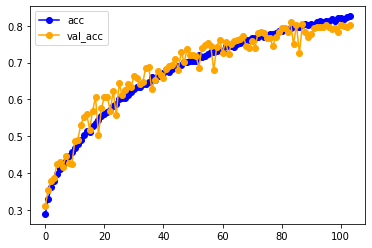

In [13]:
plot_training_progress(csv_file_path = "{fold}log_{ts}.csv".format(fold = config_log_folder, ts = config_model_timestamp),
                       train_metric = 'acc',
                       validation_metric = 'val_acc')

#### Load model & predict on test set using generator

In [14]:
cnn_model = keras.models.load_model(config_model_save_name)
probabilities = cnn_model.predict_generator(test_generator)

W0907 05:47:27.945361  1984 deprecation.py:506] From C:\Users\user\Anaconda3\lib\site-packages\tensorflow\python\ops\init_ops.py:97: calling Zeros.__init__ (from tensorflow.python.ops.init_ops) with dtype is deprecated and will be removed in a future version.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
W0907 05:47:27.959360  1984 deprecation.py:506] From C:\Users\user\Anaconda3\lib\site-packages\tensorflow\python\ops\init_ops.py:97: calling Ones.__init__ (from tensorflow.python.ops.init_ops) with dtype is deprecated and will be removed in a future version.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
W0907 05:47:28.020361  1984 deprecation.py:506] From C:\Users\user\Anaconda3\lib\site-packages\tensorflow\python\ops\init_ops.py:97: calling GlorotUniform.__init__ (from tensorflow.python.ops.init_ops) with dtype is deprecated and will be remove

#### True Positives / Class by Class Accuracy

In [15]:
class_list.sort()
actual_list = []
est_prob_of_actual = []
for i, y in enumerate(agg_test_y):
    est_prob_of_actual.append(probabilities[i, class_list.index(y)])
    actual_list.append(y)

In [16]:
tpr_npr_actual = []
true_pos = []
true_neg = []
false_pos = []
false_neg = []
for i, y in enumerate(agg_test_y):
    for z in range(len(class_list)):
        tpr_npr_actual.append(y)
        if z == class_list.index(y):
            if probabilities[i, class_list.index(y)] >= 0.5:
                true_pos.append(1)
                false_pos.append(0)
                false_neg.append(0)
                true_neg.append(0)
            else:
                false_neg.append(1)
                true_neg.append(0)
                true_pos.append(0)
                false_pos.append(0)
        else:
            if probabilities[i, class_list.index(class_list[z])] < 0.5:
                false_neg.append(0)
                true_neg.append(1)
                true_pos.append(0)
                false_pos.append(0)
            else:
                false_neg.append(0)
                true_neg.append(0)
                true_pos.append(0)
                false_pos.append(1)
            
tpr_npr_df = pd.DataFrame({'class' : tpr_npr_actual,
                           'true_pos' : true_pos,
                           'true_neg' : true_neg,
                           'false_pos' : false_pos,
                           'false_neg' : false_neg})
tpr_npr_df['total_count'] = 1

tpr_npr_df = tpr_npr_df.\
groupby(['class'], as_index = False).\
agg({'true_pos' : 'sum',
     'true_neg' : 'sum',
     'false_pos' : 'sum',
     'false_neg' : 'sum',
     'total_count' : 'sum'})

tpr_npr_df['true_positive_rate'] = tpr_npr_df['true_pos'] / (tpr_npr_df['true_pos'] + tpr_npr_df['false_neg'])
tpr_npr_df['true_negative_rate'] = tpr_npr_df['true_neg'] / (tpr_npr_df['true_neg'] + tpr_npr_df['false_pos'])
tpr_npr_df['accuracy'] = (tpr_npr_df['true_neg'] + tpr_npr_df['true_pos']) / (tpr_npr_df['true_neg'] + tpr_npr_df['true_pos'] + tpr_npr_df['false_pos'] + tpr_npr_df['false_neg'])

tpr_npr_df.head(10)

,class,true_pos,true_neg,false_pos,false_neg,total_count,true_positive_rate,true_negative_rate,accuracy
0,bathroom,261,1267,45,67,1640,0.795732,0.965701,0.931707
1,bedroom,304,1569,63,104,2040,0.745098,0.961397,0.918137
2,diningroom,341,1693,55,96,2185,0.780320,0.968535,0.930892
3,kitchen,394,1966,78,117,2555,0.771037,0.961840,0.923679
4,livingroom,366,1773,59,92,2290,0.799127,0.967795,0.934061


#### Plot estimated probabalities of each class

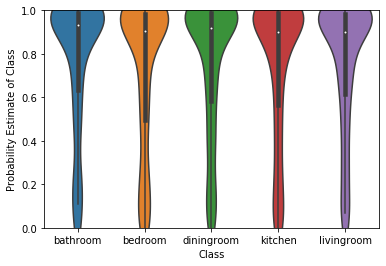

In [17]:
import seaborn as sns
class_est_df = pd.DataFrame({'Class': actual_list, 'Probability Estimate of Class' : est_prob_of_actual})
ax = sns.violinplot(x = 'Class', y = 'Probability Estimate of Class', data = class_est_df, split=True)
ax.set_ylim([0,1])
plt.show()

#### AUC by Class

In [18]:
test_set_auc = multiclass_auc(probabilities, agg_test_y, class_list)
print(pd.DataFrame(test_set_auc, index = ['AUC']))

     bathroom   bedroom  diningroom   kitchen  livingroom
AUC  0.972077  0.961427    0.964077  0.954961    0.957745


#### Load test set manually to plot individual predictions

In [19]:
test_x = [resize(np.array(load_img(c)), (config_img_height, config_img_width)) for c in agg_test_files]    

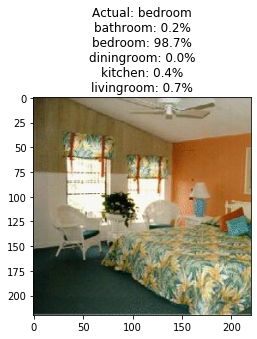

In [20]:
plot_random_test_pred(agg_test_y, probabilities, class_list, test_x)

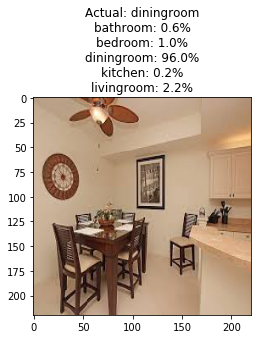

In [21]:
plot_random_test_pred(agg_test_y, probabilities, class_list, test_x)

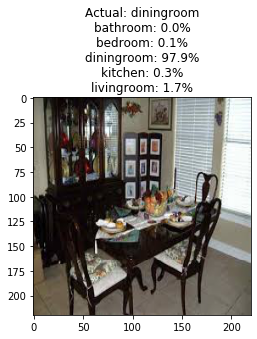

In [22]:
plot_random_test_pred(agg_test_y, probabilities, class_list, test_x)

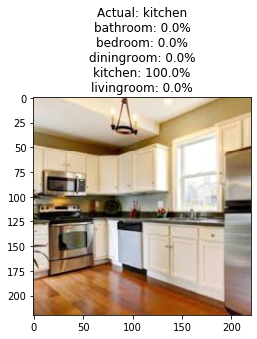

In [23]:
plot_random_test_pred(agg_test_y, probabilities, class_list, test_x)

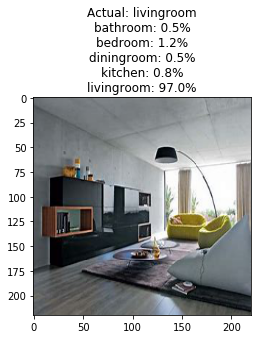

In [24]:
plot_random_test_pred(agg_test_y, probabilities, class_list, test_x)

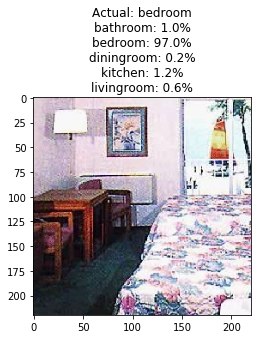

In [25]:
plot_random_test_pred(agg_test_y, probabilities, class_list, test_x)

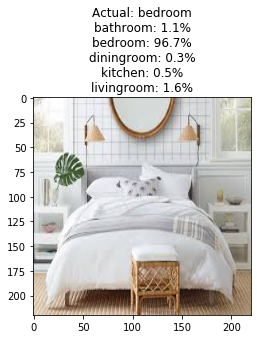

In [26]:
plot_random_test_pred(agg_test_y, probabilities, class_list, test_x)

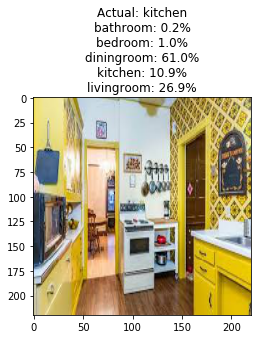

In [27]:
plot_random_test_pred(agg_test_y, probabilities, class_list, test_x)

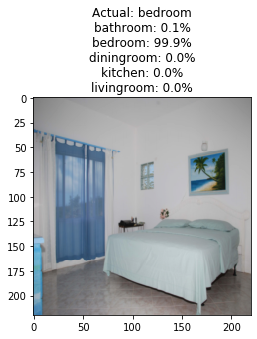

In [28]:
plot_random_test_pred(agg_test_y, probabilities, class_list, test_x)

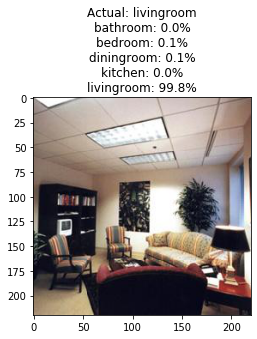

In [29]:
plot_random_test_pred(agg_test_y, probabilities, class_list, test_x)

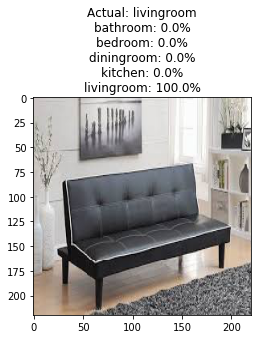

In [30]:
plot_random_test_pred(agg_test_y, probabilities, class_list, test_x)

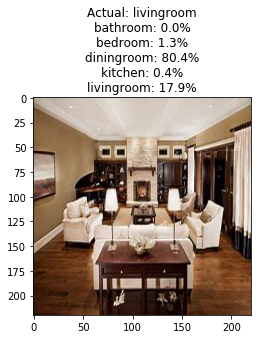

In [31]:
plot_random_test_pred(agg_test_y, probabilities, class_list, test_x)

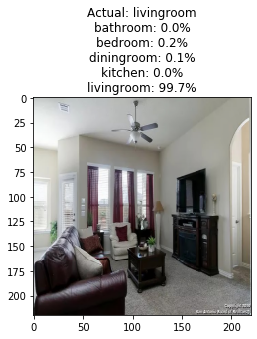

In [32]:
plot_random_test_pred(agg_test_y, probabilities, class_list, test_x)

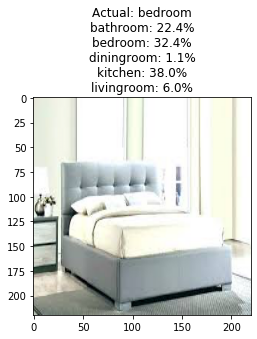

In [33]:
plot_random_test_pred(agg_test_y, probabilities, class_list, test_x)

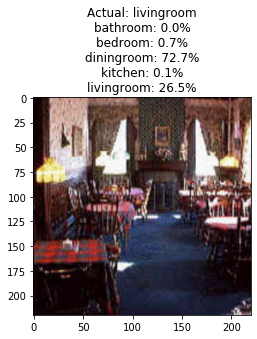

In [34]:
plot_random_test_pred(agg_test_y, probabilities, class_list, test_x)

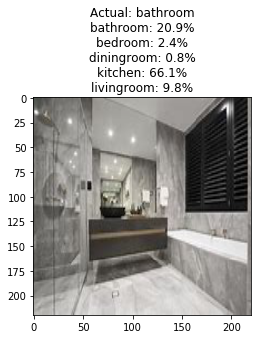

In [35]:
plot_random_test_pred(agg_test_y, probabilities, class_list, test_x)

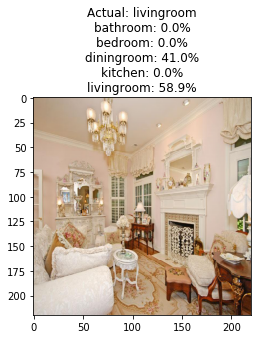

In [36]:
plot_random_test_pred(agg_test_y, probabilities, class_list, test_x)

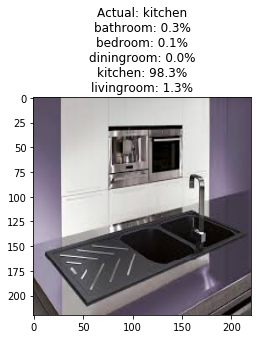

In [37]:
plot_random_test_pred(agg_test_y, probabilities, class_list, test_x)

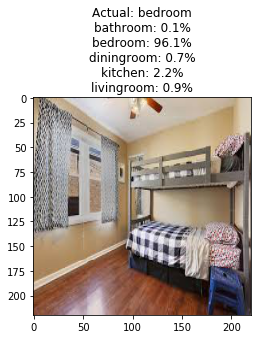

In [38]:
plot_random_test_pred(agg_test_y, probabilities, class_list, test_x)

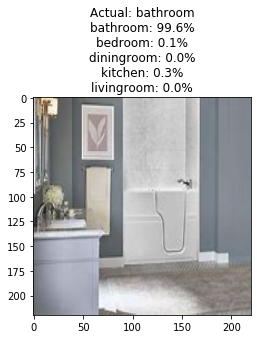

In [39]:
plot_random_test_pred(agg_test_y, probabilities, class_list, test_x)

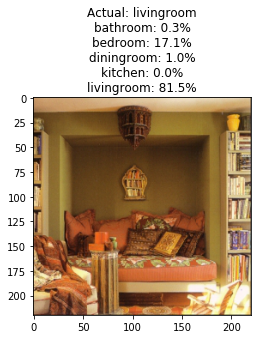

In [40]:
plot_random_test_pred(agg_test_y, probabilities, class_list, test_x)

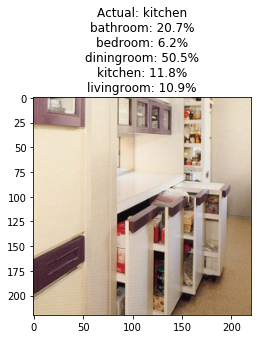

In [41]:
plot_random_test_pred(agg_test_y, probabilities, class_list, test_x)

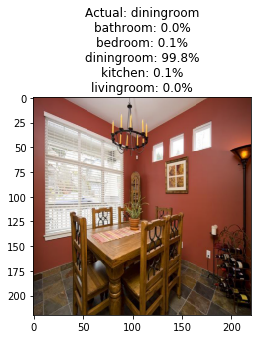

In [42]:
plot_random_test_pred(agg_test_y, probabilities, class_list, test_x)

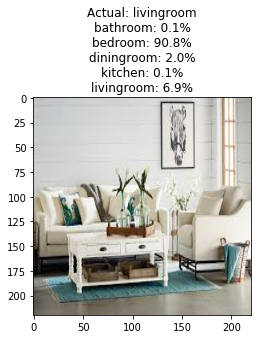

In [43]:
plot_random_test_pred(agg_test_y, probabilities, class_list, test_x)

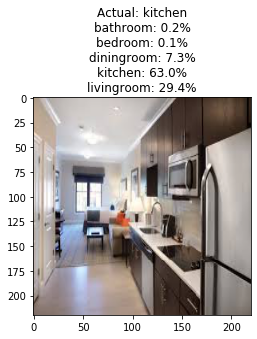

In [44]:
plot_random_test_pred(agg_test_y, probabilities, class_list, test_x)

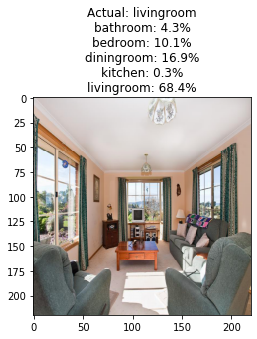

In [45]:
plot_random_test_pred(agg_test_y, probabilities, class_list, test_x)

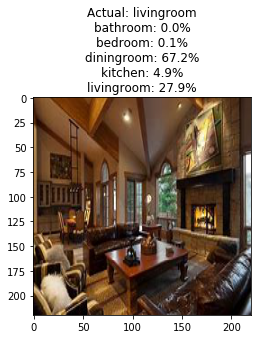

In [46]:
plot_random_test_pred(agg_test_y, probabilities, class_list, test_x)

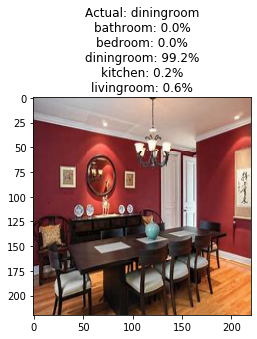

In [47]:
plot_random_test_pred(agg_test_y, probabilities, class_list, test_x)

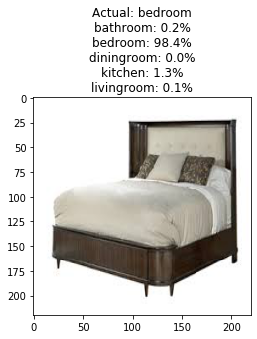

In [48]:
plot_random_test_pred(agg_test_y, probabilities, class_list, test_x)

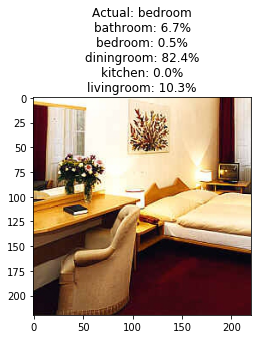

In [49]:
plot_random_test_pred(agg_test_y, probabilities, class_list, test_x)

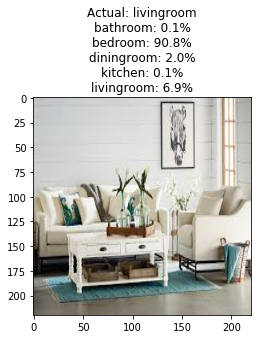

In [50]:
plot_random_test_pred(agg_test_y, probabilities, class_list, test_x)

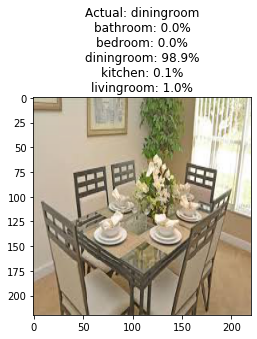

In [51]:
plot_random_test_pred(agg_test_y, probabilities, class_list, test_x)

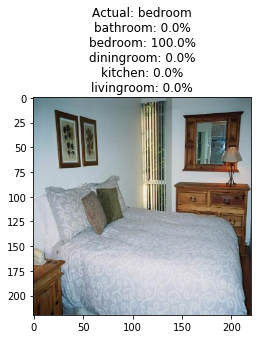

In [52]:
plot_random_test_pred(agg_test_y, probabilities, class_list, test_x)

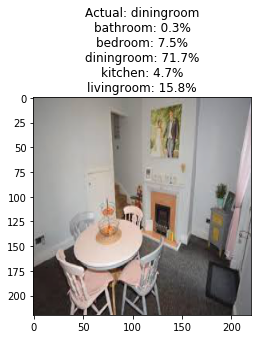

In [53]:
plot_random_test_pred(agg_test_y, probabilities, class_list, test_x)

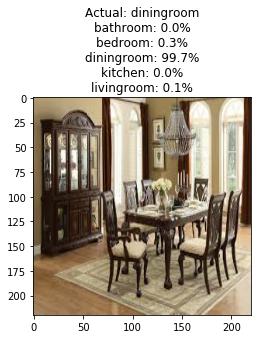

In [54]:
plot_random_test_pred(agg_test_y, probabilities, class_list, test_x)

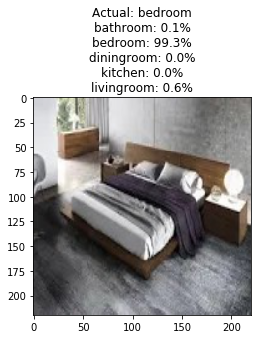

In [55]:
plot_random_test_pred(agg_test_y, probabilities, class_list, test_x)

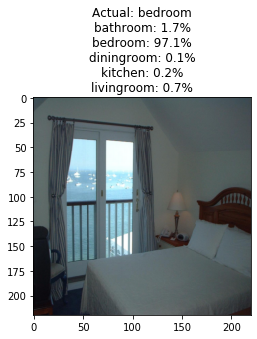

In [56]:
plot_random_test_pred(agg_test_y, probabilities, class_list, test_x)

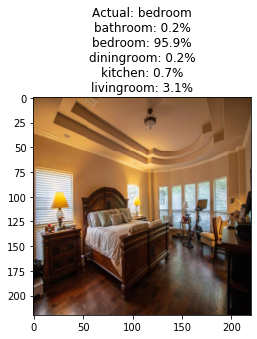

In [57]:
plot_random_test_pred(agg_test_y, probabilities, class_list, test_x)

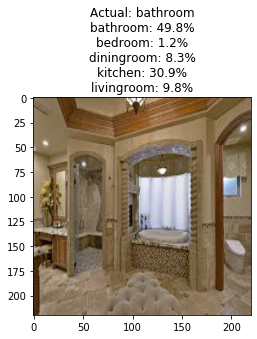

In [58]:
plot_random_test_pred(agg_test_y, probabilities, class_list, test_x)

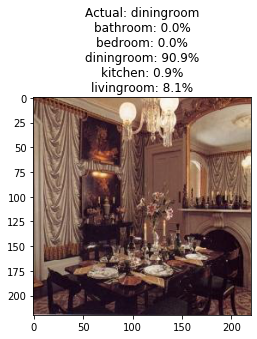

In [59]:
plot_random_test_pred(agg_test_y, probabilities, class_list, test_x)

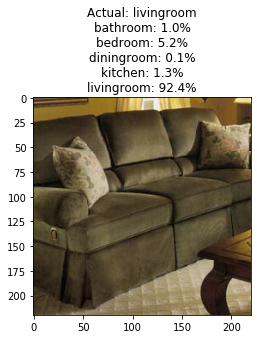

In [60]:
plot_random_test_pred(agg_test_y, probabilities, class_list, test_x)

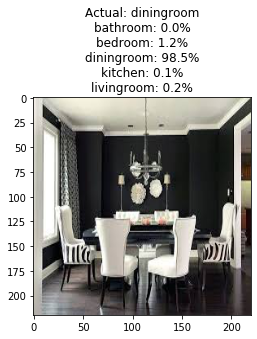

In [61]:
plot_random_test_pred(agg_test_y, probabilities, class_list, test_x)

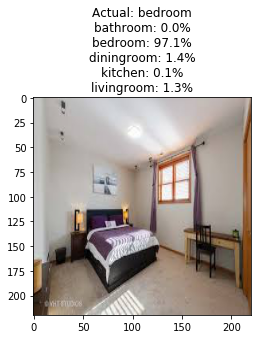

In [62]:
plot_random_test_pred(agg_test_y, probabilities, class_list, test_x)

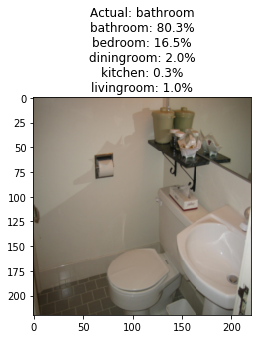

In [63]:
plot_random_test_pred(agg_test_y, probabilities, class_list, test_x)

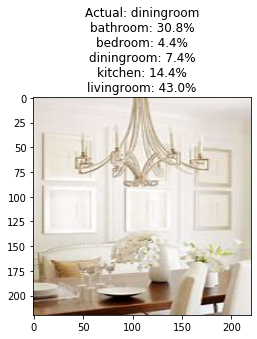

In [64]:
plot_random_test_pred(agg_test_y, probabilities, class_list, test_x)

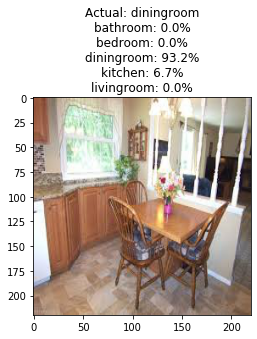

In [65]:
plot_random_test_pred(agg_test_y, probabilities, class_list, test_x)

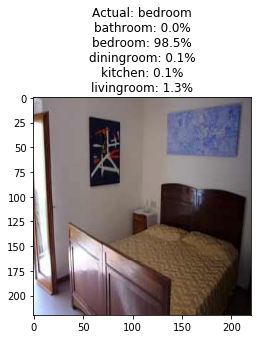

In [66]:
plot_random_test_pred(agg_test_y, probabilities, class_list, test_x)

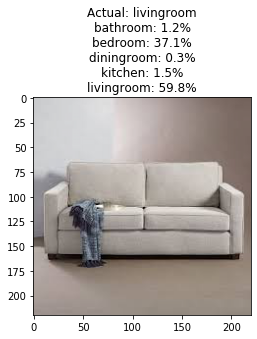

In [67]:
plot_random_test_pred(agg_test_y, probabilities, class_list, test_x)

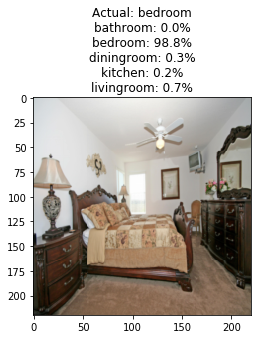

In [68]:
plot_random_test_pred(agg_test_y, probabilities, class_list, test_x)

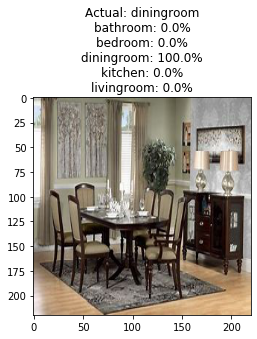

In [69]:
plot_random_test_pred(agg_test_y, probabilities, class_list, test_x)

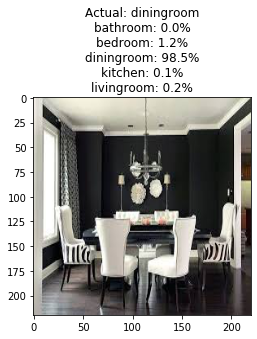

In [70]:
plot_random_test_pred(agg_test_y, probabilities, class_list, test_x)